In [1]:
"""def images_tile(path, res_x, res_y)
    
    
    img = cv2.imread(path)

    img_shape = img.shape
    tile_size = (256, 256)
    offset = (256, 256)

    for i in xrange(int(math.ceil(img_shape[0]/(offset[1] * 1.0)))):
        for j in xrange(int(math.ceil(img_shape[1]/(offset[0] * 1.0)))):
            cropped_img = img[offset[1]*i:min(offset[1]*i+tile_size[1], img_shape[0]), offset[0]*j:min(offset[0]*j+tile_size[0], img_shape[1])]
            # Debugging the tiles
            cv2.imwrite("debug_" + str(i) + "_" + str(j) + ".tif", cropped_img)
            
            """

'def images_tile(path, res_x, res_y)\n    \n    \n    img = cv2.imread(path)\n\n    img_shape = img.shape\n    tile_size = (256, 256)\n    offset = (256, 256)\n\n    for i in xrange(int(math.ceil(img_shape[0]/(offset[1] * 1.0)))):\n        for j in xrange(int(math.ceil(img_shape[1]/(offset[0] * 1.0)))):\n            cropped_img = img[offset[1]*i:min(offset[1]*i+tile_size[1], img_shape[0]), offset[0]*j:min(offset[0]*j+tile_size[0], img_shape[1])]\n            # Debugging the tiles\n            cv2.imwrite("debug_" + str(i) + "_" + str(j) + ".tif", cropped_img)\n            \n            '

In [1]:
import math
import os
import numpy as np
import matplotlib.pyplot as plt
import skimage
import skimage.io as sio
import tifffile
import json
from matplotlib import pyplot as plt
from PIL import Image, ImageFilter

import imcrop

In [2]:
file = 'P10_PAM_ipsi_40x_hippo_scan_MaxIP'
#file = 'P10_LPS_ipsi_40x_hippo_scan_MaxIP' 
#file = 'P10_PAM_ipsi_40x_hippo_scan_MaxIP' #png
#file = 'P35_PAM_ipsi_40x_hippo_scan_MaxIP' #tif
#file = 'P35_PAM_ipsi_40x_hippo_scan_MaxIP' #png
filetype = '.png'
path = r"C:/Users/David/Rockstar-Lifestyle/_Images/"

res_x = 256
res_y = 256

ij = True

im_path = path + file+ filetype

In [3]:
img_stack = imcrop.imgCrop(path, file, filetype, (256,256))

In [42]:
path = r"C:/Users/David/Rockstar-Lifestyle/Rockstar-Lifestyle/"

In [43]:
test_load_stack = imcrop.stackLoad(path,'stack_crop_RES(256, 256)_P10_LPS_ipsi_40x_hippo_scan_MaxIP')

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/David/Rockstar-Lifestyle/Rockstar-Lifestyle/stack_crop_RES(256, 256)_P10_LPS_ipsi_40x_hippo_scan_MaxIP.tif'

In [44]:
test_load_stack[50,:,:]

NameError: name 'test_load_stack' is not defined

In [45]:
test_stack[50,:,:]

array([[ 67,  51,  61, ...,  92,  72, 255],
       [ 64,  41,  59, ...,  72,  87, 118],
       [ 59,  61,  54, ..., 255, 197, 154],
       ...,
       [ 79,  72,  79, ...,  69,  79, 108],
       [ 67,  79,  61, ...,  87,  77,  72],
       [ 74,  56,  46, ..., 102,  74, 102]], dtype=uint8)

In [46]:
len(test_stack[:,0,0])

280

In [125]:
#file = 'P10_PAM_ipsi_40x_hippo_scan_MaxIP'
file = 'P10_LPS_ipsi_40x_hippo_scan_MaxIP' 
#file = 'P10_PAM_ipsi_40x_hippo_scan_MaxIP' #png
#file = 'P35_PAM_ipsi_40x_hippo_scan_MaxIP' #tif
#file = 'P35_PAM_ipsi_40x_hippo_scan_MaxIP' #png
filetype = '.png'
path = r"C:/Users/David/Rockstar-Lifestyle/_Images/"

res_x = 256
res_y = 256

ij = True

im_path = path + file+ filetype

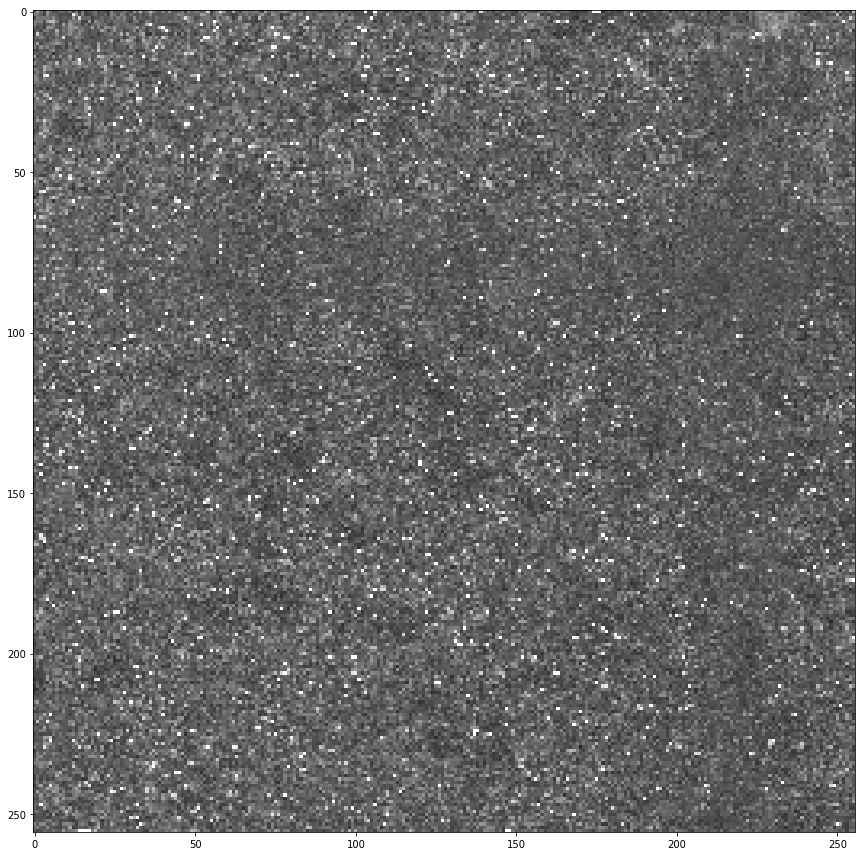

In [155]:
plt.subplots(figsize = (12,12))
sio.imshow(img_stack[30,:,:], vmin = 10, vmax = 210)

In [49]:
im = Image.open(im_path)

r,g,b = im.split()


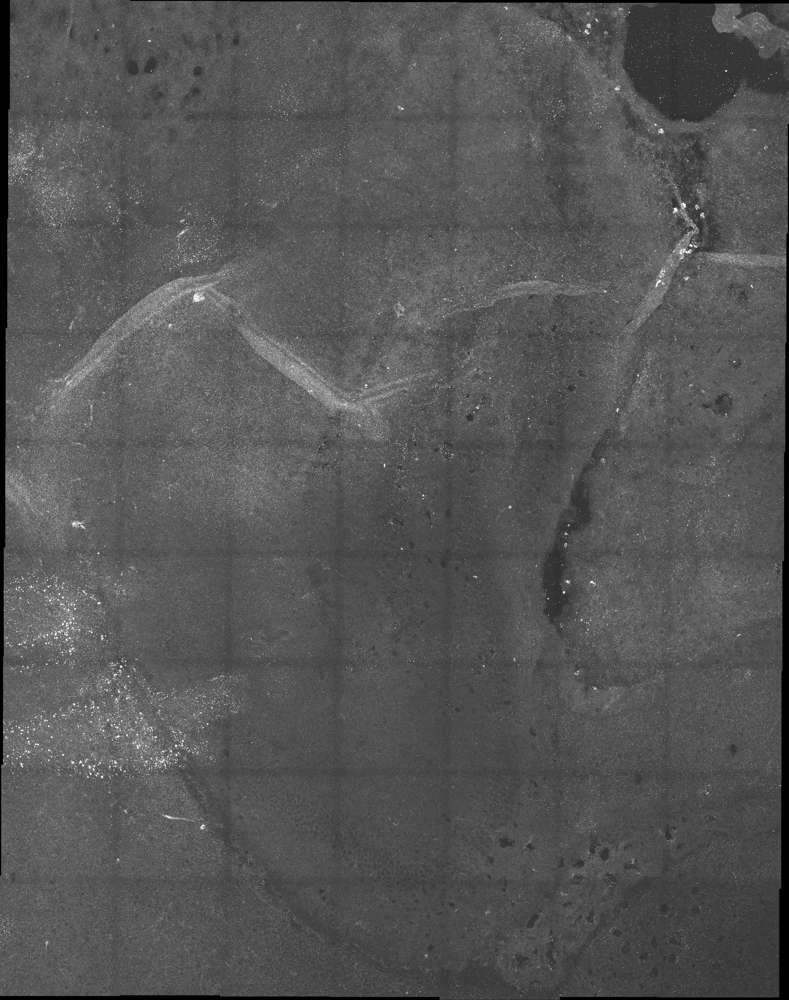

In [50]:
g

In [51]:
im.close

<bound method Image.close of <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3358x4252 at 0x1F92968D320>>

In [52]:
timpng = sio.imread(im_path)

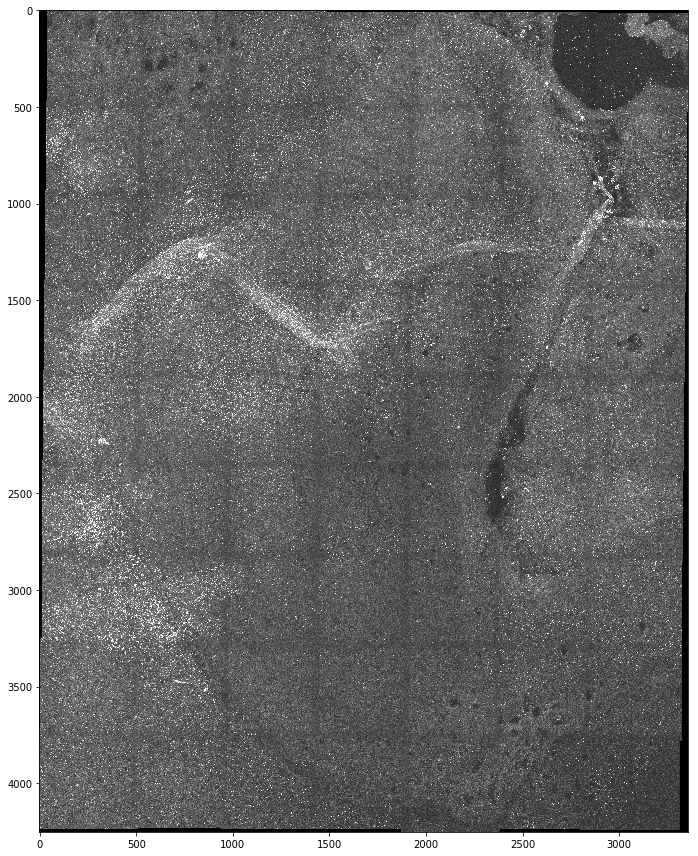

In [53]:
plt.subplots(figsize=(12,12))
sio.imshow(timpng[:,:,1] , vmin = 10, vmax = 210)

In [54]:
_img = timpng[:,:,1]
_img.shape

(4252, 3358)

In [130]:
im_path = path + file + filetype
img = sio.imread(im_path)

img_shape = img.shape
tile_size = (res_x, res_y)
offset = (res_x, res_y)

border = ((len(img[:,0]) % res_x)//2, (len(img[0,:]) % res_y)//2)

img_list = []
img_crop = np.zeros(shape = tile_size, dtype = 'uint16')

img_stack = np.zeros(shape = (0, 0, 0, 0), dtype = 'uint16')

#_img = img[:,:,:] # Achieve only 1 stack of input picture. Change to other numbers to analyze other stacks

i = 0

img_list = []
#_img = img[:,:]
print(len(_img[0,:]))
for j in range(len(_img[0,:])//res_x):
    for i in range(len(img[:,0])//res_y):
        # img_loc ='({}:{},{}:{})'.format(i*tile_size[0]+border[0], i*tile_size[0]+border[0]+offset[0], j*tile_size[1]+border[1],j*tile_size[1]+border[1]+offset[1])
        img_crop = _img[i*tile_size[0]+border[0]:i*tile_size[0]+border[0]+offset[0], j*tile_size[1]+border[1]:j*tile_size[1]+border[1]+offset[1]]
        img_list.append(img_crop)
        
    #print(img_list)    

img_stack = np.swapaxes(np.dstack(img_list), 2, 0)
img_stack = np.swapaxes(img_stack, 2, 1)
print(img_stack.shape)

metadata = json.dumps({"res" : tile_size, "orig_Img" : file, "dtype" : img_stack.dtype.str})
if ij == True: metadata = {"Info": metadata}

tifffile.imsave('stack_crop_RES{}_{}{}'.format(tile_size, file, '.tif'), img_stack, metadata = metadata, imagej = True)

plt.subplots(figsize=(12,12))
sio.imshow(img_stack[50,:,:], vmin = 10, vmax = 210)
plt.show()

3358
(208, 256, 256)


PermissionError: [Errno 13] Permission denied: 'C:\\Users\\David\\Rockstar-Lifestyle\\stack_crop_RES(256, 256)_P10_LPS_ipsi_40x_hippo_scan_MaxIP.tif'

In [155]:
from PIL import Image, ImageFilter
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import scipy
from scipy.ndimage import gaussian_filter
import MultiresHist as mult

In [57]:
#List of the number of bins you want for the histograms
bin_list = [3]

#List for the gaussian blur sigma variable
gauss_blur_list = [0,3] #Funciton only works for two gauss blurs currently

In [58]:
img = Image.open('g.png').convert('L')

In [59]:
timpng = sio.imread('stack_crop_RES{}_{}{}'.format(tile_size, file, '.tif'))

In [60]:
for img in test_stack[:,_,_]:
    print('test')

test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test
test


In [61]:
timpng[50,:,:]

array([[100,  72, 100, ...,  69,  74,  87],
       [ 77,  82,  82, ..., 110,  69,  74],
       [ 79,  92,  61, ...,  77,  72,  56],
       ...,
       [ 79,  79,  79, ...,  72,  56, 100],
       [ 79, 115,  82, ...,  84,  72, 255],
       [100,  46,  95, ...,  84,  72, 115]], dtype=uint8)

In [62]:
img_stack[50,:,:]

array([[100,  72, 100, ...,  69,  74,  87],
       [ 77,  82,  82, ..., 110,  69,  74],
       [ 79,  92,  61, ...,  77,  72,  56],
       ...,
       [ 79,  79,  79, ...,  72,  56, 100],
       [ 79, 115,  82, ...,  84,  72, 255],
       [100,  46,  95, ...,  84,  72, 115]], dtype=uint8)

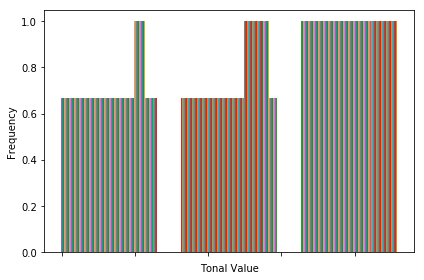

In [63]:
mult.Multi_res_hist_full(img_stack[50,:,:], bin_list, gauss_blur_list, show_figs = False)

In [156]:
arr = img_stack[50,:,:]
gauss_blur_images = mult.gauss_filter(arr, gauss_blur_list)

[array([0.94140625, 0.9921875 , 1.        ]),
 array([0.8984375 , 0.98828125, 1.        ]),
 array([0.88671875, 0.9765625 , 1.        ]),
 array([0.90234375, 0.99609375, 1.        ]),
 array([0.90234375, 0.9921875 , 1.        ]),
 array([0.8984375 , 0.98828125, 1.        ]),
 array([0.9296875, 0.9921875, 1.       ]),
 array([0.91015625, 0.9921875 , 1.        ]),
 array([0.93359375, 0.98828125, 1.        ]),
 array([0.921875  , 0.99609375, 1.        ]),
 array([0.91796875, 0.99609375, 1.        ]),
 array([0.91015625, 0.9921875 , 1.        ]),
 array([0.9140625, 0.984375 , 1.       ]),
 array([0.91796875, 0.9921875 , 1.        ]),
 array([0.91015625, 0.99609375, 1.        ]),
 array([0.9296875, 0.984375 , 1.       ]),
 array([0.91015625, 0.98828125, 1.        ]),
 array([0.93359375, 0.99609375, 1.        ]),
 array([0.94921875, 0.99609375, 1.        ]),
 array([0.91015625, 0.9765625 , 1.        ]),
 array([0.890625  , 0.97265625, 1.        ]),
 array([0.875     , 0.98046875, 1.        ]

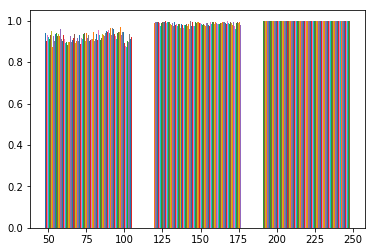

In [65]:
#print(len(gauss_blur_images))
#print(len(bin_list))
hist_itt = plt.hist(gauss_blur_images[0], bins=bin_list[0], density = True, cumulative = True)
hist_itt[0]

In [66]:
hist_itt, bin_cnt = np.histogram(gauss_blur_images[0], bins=bin_list[0], density=True)
#np.cumsum(hist_itt, bin_cnt)

In [67]:
counts, start, dx, _ = scipy.stats.cumfreq(gauss_blur_images[0], numbins=bin_list[0])
x = np.arange(counts.size) * dx + start

In [68]:
x

array([-12.5,  94.5, 201.5])

In [69]:
import scipy.stats

In [152]:
def cumulative_hist(gauss_blur_images, bin_list, show_figs = True):
    hist = []
    for images in gauss_blur_images:

        for bin_count in bin_list:
            fig = plt.figure()
            hist_itt = plt.hist(images, bins=bin_count, density = True, cumulative = True)
            plt.show(block = show_figs)
            hist.append(hist_itt)
    return hist

In [192]:
import time
from matplotlib import pyplot as plt

In [185]:
arr = img_stack[50,:,:]

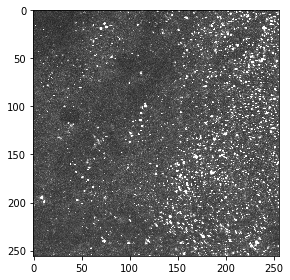

In [191]:
plt.subplots()
sio.imshow(arr)

AttributeError: 'list' object has no attribute 'figure'

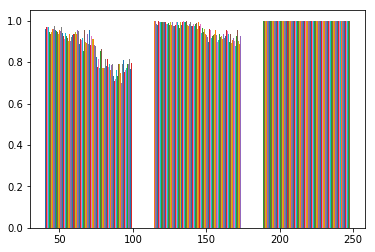

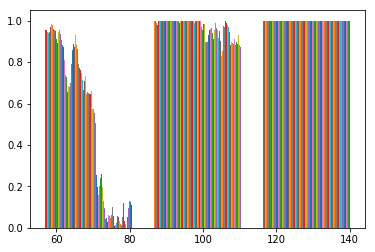

In [186]:
t1 = time.time()
gauss_blur_images = mult.gauss_filter(arr, gauss_blur_list)
c1 = mult.cumulative_hist(gauss_blur_images, bin_list, show_figs = True)
plt1=c1[0]
plt2=c1[1]
heights = mult.diff_hist(plt1, plt2)
fig = plt.figure()
ax1 = fig.add_subplot(111) 

ax1.hist(heights, bins=3, density = True, cumulative = True)
ax1.set_xlabel('Tonal Value')
ax1.set_ylabel('Frequency')
ax1.set_xticklabels([])
ax1.set_title('Difference Histogram')

fig.tight_layout()




In [183]:
arr

array([[[ 56,  77,  54, ...,  69,  64,  84],
        [ 56,  74,  56, ...,  64, 100,  64],
        [ 51,  64,  51, ...,  77,  69,  67],
        ...,
        [ 87,  64,  74, ..., 151, 108,  95],
        [ 84,  95,  74, ...,  67,  77,  79],
        [ 59,  74,  69, ...,  77,  84, 102]],

       [[ 61,  59,  87, ...,  69,  84, 151],
        [ 77,  90,  61, ...,  90, 177, 146],
        [ 74,  84,  92, ...,  77,  64,  95],
        ...,
        [ 59,  56,  69, ..., 108,  79, 102],
        [ 92,  69,  61, ...,  69,  77,  56],
        [ 74,  64,  67, ...,  74,  64,  77]],

       [[ 67,  72,  64, ...,  67, 108,  77],
        [ 56,  69, 255, ...,  67,  97,  92],
        [ 95, 100,  59, ...,  92, 100,  69],
        ...,
        [ 67,  67,  82, ...,  79,  64,  79],
        [ 61,  84, 133, ...,  56,  56,  54],
        [125,  72,  95, ...,  51,  84, 123]],

       ...,

       [[ 67,  69,  69, ...,  56,  67,  61],
        [ 84, 100,  69, ...,  69,  56,  72],
        [ 77,  72,  64, ...,  69,  69,  69

In [74]:
t2 = time.time()
print(t2-t1)

9.950761318206787


In [180]:
arr

array([[ 67,  51,  61, ...,  92,  72, 255],
       [ 64,  41,  59, ...,  72,  87, 118],
       [ 59,  61,  54, ..., 255, 197, 154],
       ...,
       [ 79,  72,  79, ...,  69,  79, 108],
       [ 67,  79,  61, ...,  87,  77,  72],
       [ 74,  56,  46, ..., 102,  74, 102]], dtype=uint8)

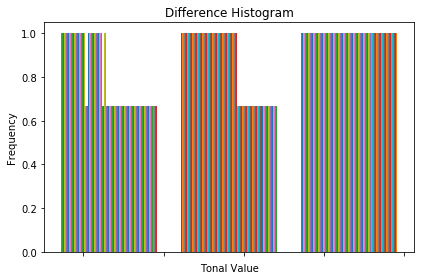

In [158]:

t1 = time.time()
gauss_blur_images = mult.gauss_filter(arr, gauss_blur_list)
c2 = mult.cumulative_hist(gauss_blur_images, bin_list, show_figs = False)
plt1=c2[0]
plt2=c2[1]
heights = mult.diff_hist(plt1, plt2)

fig = plt.figure()
ax1 = fig.add_subplot(111) 

ax1.hist(heights, bins=3, density = True, cumulative = True)
ax1.set_xlabel('Tonal Value')
ax1.set_ylabel('Frequency')
ax1.set_xticklabels([])
ax1.set_title('Difference Histogram')

fig.tight_layout()


In [76]:

t2 = time.time()
print(t2-t1)


7.342921733856201


In [77]:

from scipy.stats import gaussian_kde


In [78]:

def cumulative_hist(gauss_blur_images, bin_list, show_figs = True):
    hist = []
    for images in gauss_blur_images:

        for bin_count in bin_list:
            fig = plt.figure()
            hist_itt = np.histogram(images, bins=bin_count, density = True)
            plt.show(block = show_figs)
            hist.append(hist_itt)
    return hist


In [79]:

x = [np.array([])]


In [80]:

import matplotlib.cbook as cbook


In [81]:

cbook.iterable(bin_list)


True

In [82]:

cumulative_Histograms[1][0]


NameError: name 'cumulative_Histograms' is not defined

In [168]:
obj.MRH[1]

([array([0.8046875, 1.       , 1.       ]),
  array([0.8203125, 1.       , 1.       ]),
  array([0.83984375, 1.        , 1.        ]),
  array([0.875, 1.   , 1.   ]),
  array([0.8828125, 1.       , 1.       ]),
  array([0.91796875, 1.        , 1.        ]),
  array([0.92578125, 1.        , 1.        ]),
  array([0.92578125, 1.        , 1.        ]),
  array([0.9296875, 1.       , 1.       ]),
  array([0.91015625, 1.        , 1.        ]),
  array([0.90625, 1.     , 1.     ]),
  array([0.9140625, 1.       , 1.       ]),
  array([0.9140625, 1.       , 1.       ]),
  array([0.890625, 1.      , 1.      ]),
  array([0.9140625, 1.       , 1.       ]),
  array([0.91796875, 1.        , 1.        ]),
  array([0.91015625, 1.        , 1.        ]),
  array([0.91015625, 1.        , 1.        ]),
  array([0.91015625, 1.        , 1.        ]),
  array([0.90625, 1.     , 1.     ]),
  array([0.90234375, 1.        , 1.        ]),
  array([0.89453125, 1.        , 1.        ]),
  array([0.890625, 1.     

In [164]:
plt1

([array([0.9609375, 0.9921875, 1.       ]),
  array([0.9453125, 1.       , 1.       ]),
  array([0.96875   , 0.99609375, 1.        ]),
  array([0.96875, 1.     , 1.     ]),
  array([0.95703125, 1.        , 1.        ]),
  array([0.9765625 , 0.99609375, 1.        ]),
  array([0.96875   , 0.99609375, 1.        ]),
  array([0.96875 , 0.984375, 1.      ]),
  array([0.93359375, 0.98046875, 1.        ]),
  array([0.96875   , 0.98828125, 1.        ]),
  array([0.921875  , 0.98046875, 1.        ]),
  array([0.97265625, 0.98828125, 1.        ]),
  array([0.9453125 , 0.98828125, 1.        ]),
  array([0.94921875, 1.        , 1.        ]),
  array([0.9609375, 1.       , 1.       ]),
  array([0.9375   , 0.9921875, 1.       ]),
  array([0.9453125, 0.9921875, 1.       ]),
  array([0.95703125, 0.99609375, 1.        ]),
  array([0.9453125 , 0.99609375, 1.        ]),
  array([0.94140625, 0.99609375, 1.        ]),
  array([0.9375    , 0.99609375, 1.        ]),
  array([0.9609375 , 0.99609375, 1.        

In [165]:
plt2

([array([0.95703125, 1.        , 1.        ]),
  array([0.9609375, 1.       , 1.       ]),
  array([0.95703125, 1.        , 1.        ]),
  array([0.953125, 1.      , 1.      ]),
  array([0.953125, 1.      , 1.      ]),
  array([0.953125, 1.      , 1.      ]),
  array([0.9453125, 1.       , 1.       ]),
  array([0.94140625, 0.98828125, 1.        ]),
  array([0.94140625, 0.98046875, 1.        ]),
  array([0.94140625, 0.9765625 , 1.        ]),
  array([0.9375    , 0.98046875, 1.        ]),
  array([0.94140625, 0.984375  , 1.        ]),
  array([0.9453125, 1.       , 1.       ]),
  array([0.953125, 1.      , 1.      ]),
  array([0.95703125, 1.        , 1.        ]),
  array([0.96875, 1.     , 1.     ]),
  array([0.9765625, 1.       , 1.       ]),
  array([0.9921875, 1.       , 1.       ]),
  array([0.984375, 1.      , 1.      ]),
  array([0.9921875, 1.       , 1.       ]),
  array([0.99609375, 1.        , 1.        ]),
  array([0.98046875, 1.        , 1.        ]),
  array([0.97265625, 1.

In [166]:
heights

[[0.003906249999999778, -0.007812500000000111, -1.1102230246251565e-16],
 [0.003906249999999778, -0.007812500000000111, -1.1102230246251565e-16],
 [0.003906249999999778, -0.007812500000000111, -1.1102230246251565e-16],
 [-0.01562500000000011, 0.0, 0.0],
 [-0.01562500000000011, 0.0, 0.0],
 [-0.01562500000000011, 0.0, 0.0],
 [0.011718749999999889, -0.00390625, 0.0],
 [0.011718749999999889, -0.00390625, 0.0],
 [0.011718749999999889, -0.00390625, 0.0],
 [0.01562500000000011, 1.1102230246251565e-16, 1.1102230246251565e-16],
 [0.01562500000000011, 1.1102230246251565e-16, 1.1102230246251565e-16],
 [0.01562500000000011, 1.1102230246251565e-16, 1.1102230246251565e-16],
 [0.003906250000000111, 1.1102230246251565e-16, 1.1102230246251565e-16],
 [0.003906250000000111, 1.1102230246251565e-16, 1.1102230246251565e-16],
 [0.003906250000000111, 1.1102230246251565e-16, 1.1102230246251565e-16],
 [0.02343750000000011, -0.003906249999999889, 1.1102230246251565e-16],
 [0.02343750000000011, -0.003906249999999

In [83]:

len(cumulative_Histograms[0][0])


NameError: name 'cumulative_Histograms' is not defined

In [84]:

cumulative_Histograms = cumulative_hist_scipy(gauss_blur_images, bin_list, show_figs = False)


NameError: name 'cumulative_hist_scipy' is not defined

In [85]:
cumulative_Histograms

NameError: name 'cumulative_Histograms' is not defined

In [86]:
cumulative_Histograms = cumulative_hist_np(gauss_blur_images, bin_list, show_figs = False)

NameError: name 'cumulative_hist_np' is not defined

In [87]:
cumulative_Histograms

NameError: name 'cumulative_Histograms' is not defined

In [88]:
plt1=cumulative_Histograms[0]
plt2=cumulative_Histograms[1]



NameError: name 'cumulative_Histograms' is not defined

In [89]:
import matplotlib.axes._axes
import matplotlib.cbook.CallbackRegistry

ModuleNotFoundError: No module named 'matplotlib.cbook.CallbackRegistry'

In [90]:
matplotlib.axes._axes.gca().hist()

AttributeError: module 'matplotlib.axes._axes' has no attribute 'gca'

In [91]:
heights = mult.diff_hist(plt1, plt2)

In [92]:
heights

[[0.5192307692307693, 0.7259615384615385, 1.1102230246251565e-16],
 [0.5192307692307693, 0.7259615384615385, 1.1102230246251565e-16],
 [0.5192307692307693, 0.7259615384615385, 1.1102230246251565e-16],
 [0.5528846153846154, 0.7403846153846154, 0.0],
 [0.5528846153846154, 0.7403846153846154, 0.0],
 [0.5528846153846154, 0.7403846153846154, 0.0],
 [0.5625000000000001, 0.7403846153846154, 1.1102230246251565e-16],
 [0.5625000000000001, 0.7403846153846154, 1.1102230246251565e-16],
 [0.5625000000000001, 0.7403846153846154, 1.1102230246251565e-16],
 [0.5288461538461539, 0.7355769230769231, 1.1102230246251565e-16],
 [0.5288461538461539, 0.7355769230769231, 1.1102230246251565e-16],
 [0.5288461538461539, 0.7355769230769231, 1.1102230246251565e-16],
 [0.5817307692307693, 0.7307692307692308, 0.0],
 [0.5817307692307693, 0.7307692307692308, 0.0],
 [0.5817307692307693, 0.7307692307692308, 0.0],
 [0.5336538461538461, 0.7307692307692308, 0.0],
 [0.5336538461538461, 0.7307692307692308, 0.0],
 [0.533653846

In [93]:
img_stack[50,:,:].convert('L')

AttributeError: 'numpy.ndarray' object has no attribute 'convert'

In [94]:
img = Image.open('stack_crop_RES(256, 256)_P10_LPS_ipsi_40x_hippo_scan_MaxIP.tif')

In [95]:
x = []
x = img.split()

In [96]:
img.getdata

<bound method Image.getdata of <PIL.TiffImagePlugin.TiffImageFile image mode=L size=256x256 at 0x1F922FA4C88>>

In [97]:
img_stack.shape

(208, 256, 256)

In [98]:
img_stack.shape

(208, 256, 256)

In [99]:

path = r"C:/Users/David/Rockstar-Lifestyle/"
#im_test = Image.open('{}stack_crop_RES{}_{}{}'.format(path,tile_size, file, filetype))
#im_test.close()
with Image.open('{}stack_crop_RES{}_{}{}'.format(path,tile_size, file, filetype)) as im_test:
    #im_test.split()
    Image.open(im_test)
    

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/David/Rockstar-Lifestyle/stack_crop_RES(256, 256)_P10_LPS_ipsi_40x_hippo_scan_MaxIP.png'

In [100]:
im_test

NameError: name 'im_test' is not defined

In [101]:
r,g,b = im_test.split()

NameError: name 'im_test' is not defined

In [102]:
border[0]

78

In [103]:
description = "This image is a stack of {} cropped {} images with a resolution of {}. Its original image is from {}{}.".format(img_stack.shape[2], filetype, tile_size, file, filetype)
description

'This image is a stack of 256 cropped .png images with a resolution of (256, 256). Its original image is from P10_LPS_ipsi_40x_hippo_scan_MaxIP.png.'

In [105]:
cropped_img = np.zeros(shape = tile_size, dtype = 'uint16')
print(cropped_img)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [106]:
img = sio.imread(im_path)

In [107]:
4174 + border_x

NameError: name 'border_x' is not defined

In [108]:
img[0,:,:].shape

(3358, 3)

In [109]:
len(img[0,0,:]) % res_x

3

In [110]:
len(img[0,:,0]) % res_y

30

In [111]:
border_x = (len(img[0,0,:]) % res_x)//2
border_y = (len(img[0,:,0]) % res_y)//2

In [112]:
len(img[0,0,:])-border_x

2

In [113]:
range(border_x, len(img[0,0,:])-border_x)

range(1, 2)

In [114]:
len(img[0,0,:])//res_x

0

In [115]:
cropped_img.dtype.str

'<u2'

In [117]:
img_stack = np.zeros(shape = (250, 250, 0), dtype = 'uint16')

In [118]:
img_stack

array([], shape=(250, 250, 0), dtype=uint16)

In [119]:
import scipy
import skimage

In [179]:
gauss_blur_images

[array([[ 67,  51,  61, ...,  92,  72, 255],
        [ 64,  41,  59, ...,  72,  87, 118],
        [ 59,  61,  54, ..., 255, 197, 154],
        ...,
        [ 79,  72,  79, ...,  69,  79, 108],
        [ 67,  79,  61, ...,  87,  77,  72],
        [ 74,  56,  46, ..., 102,  74, 102]], dtype=uint8),
 array([[ 57,  58,  58, ..., 114, 120, 123],
        [ 57,  57,  58, ..., 114, 120, 123],
        [ 57,  57,  57, ..., 115, 120, 123],
        ...,
        [ 72,  72,  73, ...,  84,  84,  85],
        [ 71,  72,  72, ...,  84,  84,  85],
        [ 71,  71,  72, ...,  84,  85,  85]], dtype=uint8)]

In [178]:
obj.GB

[array([[ 61,  59,  87, ...,  69,  84, 151],
        [ 77,  90,  61, ...,  90, 177, 146],
        [ 74,  84,  92, ...,  77,  64,  95],
        ...,
        [ 59,  56,  69, ..., 108,  79, 102],
        [ 92,  69,  61, ...,  69,  77,  56],
        [ 74,  64,  67, ...,  74,  64,  77]], dtype=uint8),
 array([[ 76,  76,  76, ..., 119, 118, 117],
        [ 76,  76,  76, ..., 117, 116, 115],
        [ 78,  78,  77, ..., 114, 113, 112],
        ...,
        [ 69,  69,  69, ...,  75,  75,  76],
        [ 68,  68,  68, ...,  74,  74,  75],
        [ 68,  68,  68, ...,  74,  74,  74]], dtype=uint8)]

In [230]:
import MultiresHist as mH

class imgID():
    # Creating an identifier for every image for later use in neural network
    def __init__(self, name,
    			 image):
        self.name = name
        self.image = image
        self.MRH = []
        self.GB = []
        self.bin_list = []
        self.heights = []
        self.count = []

    def calc_heights(self, plt1,
    				 plt2):
        self.heights = mH.diff_hist(plt1, plt2)

    def calc_MRH(self, bins,
    			 show_figs = False):
        cumulative_data = []
        if self.GB == []:
            warnings.warn("Gaussian blur needs to be performed before Multi Res Histogram")
        self.MRH = mH.cumulative_hist(self.GB, bins, show_figs = show_figs)
        for i in range(len(self.MRH[0][:])):
            self.bin_list.append(self.MRH[i][1])

    def calc_GB(self, gauss_blur_list):
        self.GB = mH.gauss_filter(self.image, gauss_blur_list)

def stackMRH(stacked_img):
	"""
	Parameters
	----------
	stacked_img:  :

	Return
	------
	objlist : list[objects] :
	"""

    objlist = []
    for k in range(len(stacked_img[:,:,0])):
        plt = []
        obj = imgID(dict({'Image' : '{}/{}'.format((k+1),len(stacked_img[:,:,0]))}), stacked_img[k,:,:])
        obj.calc_GB(gauss_blur_list)
        obj.calc_MRH(bin_list, show_figs = False)
        plt1 = obj.MRH[0]
        plt2 = obj.MRH[1]
        obj.calc_heights(plt1,plt2)
        objlist.append(obj)
    return objlist

In [210]:
import MultiresHist as mH
k = 1
dict({'Image' : k})
img_stack[k,:,:]
[np.array([], dtype=float)]

[array([], dtype=float64)]

In [176]:
gauss_blur_list = [0,3]
bin_list = [3]

In [13]:
a = MRHData(dict({'Image' : k}))

In [181]:
arr = img_stack

In [229]:
img_stack[1,:,:]

array([[ 61,  59,  87, ...,  69,  84, 151],
       [ 77,  90,  61, ...,  90, 177, 146],
       [ 74,  84,  92, ...,  77,  64,  95],
       ...,
       [ 59,  56,  69, ..., 108,  79, 102],
       [ 92,  69,  61, ...,  69,  77,  56],
       [ 74,  64,  67, ...,  74,  64,  77]], dtype=uint8)

In [240]:
test_list = stackMRH(img_stack)

In [242]:
test_list[60].heights

[[0.62890625, -0.0078125, 0.0],
 [0.62890625, -0.0078125, 0.0],
 [0.62890625, -0.0078125, 0.0],
 [0.6328125, -0.0078125, 0.0],
 [0.6328125, -0.0078125, 0.0],
 [0.6328125, -0.0078125, 0.0],
 [0.6484375, -0.00390625, 0.0],
 [0.6484375, -0.00390625, 0.0],
 [0.6484375, -0.00390625, 0.0],
 [0.6328125, 0.0, 0.0],
 [0.6328125, 0.0, 0.0],
 [0.6328125, 0.0, 0.0],
 [0.61328125, -0.00390625, 0.0],
 [0.61328125, -0.00390625, 0.0],
 [0.61328125, -0.00390625, 0.0],
 [0.61328125, 0.0, 0.0],
 [0.61328125, 0.0, 0.0],
 [0.61328125, 0.0, 0.0],
 [0.60546875, -0.0078125, 0.0],
 [0.60546875, -0.0078125, 0.0],
 [0.60546875, -0.0078125, 0.0],
 [0.59765625, 0.0, 0.0],
 [0.59765625, 0.0, 0.0],
 [0.59765625, 0.0, 0.0],
 [0.58984375, -0.0078125, 0.0],
 [0.58984375, -0.0078125, 0.0],
 [0.58984375, -0.0078125, 0.0],
 [0.59375, 0.0, 0.0],
 [0.59375, 0.0, 0.0],
 [0.59375, 0.0, 0.0],
 [0.59375, -0.0078125, 0.0],
 [0.59375, -0.0078125, 0.0],
 [0.59375, -0.0078125, 0.0],
 [0.59765625, -0.0078125, 0.0],
 [0.59765625, -0.

In [214]:
stacked_img = img_stack
plt = []
_img = stacked_img[k,:,:]
obj = MRHData(dict({'Image' : k}), _img)
obj.image
obj.calc_GB(gauss_blur_list)
obj.calc_MRH(bin_list)

plt1 = obj.MRH[0]
plt2 = obj.MRH[1]
obj.calc_heights(plt1, plt2)
#heights = mH.diff_hist(plt1, plt2)

In [199]:
objlist[5].heights

NameError: name 'objlist' is not defined

In [80]:
obj.bin_list[0]

array([ 31.        , 105.66666667, 180.33333333, 255.        ])

In [221]:
gauss_blur_images[0]

array([[100,  72, 100, ...,  69,  74,  87],
       [ 77,  82,  82, ..., 110,  69,  74],
       [ 79,  92,  61, ...,  77,  72,  56],
       ..., 
       [ 79,  79,  79, ...,  72,  56, 100],
       [ 79, 115,  82, ...,  84,  72, 255],
       [100,  46,  95, ...,  84,  72, 115]], dtype=uint8)

In [224]:
x = gauss_blur_images[0]

In [233]:
nx = len(x)
w = [None] * nx
density = True
hist_kwargs = dict(range=None, density=density)
tops = []
mlast = None
for i in range(nx)
    m, bins = np.histogram(x[i], bins, density = True)

In [283]:
from numbers import Number
import matplotlib.cbook as cbook


def dens_cum_hist(x, bins=None):   
    # ...\matplotlib-base-3.0.3-py37h3e3dc42_0\Lib\site-packages\matplotlib\axes\_axes.py
    # 
    
    
    x = cbook._reshape_2D(x, 'x')
    nx = len(x)
    xmin = np.inf
    xmax = -np.inf
    for xi in x:
        if len(xi) > 0:
            xmin = min(xmin, np.nanmin(xi))
            xmax = max(xmax, np.nanmax(xi))
    bin_range = (xmin, xmax)
    hist_kwargs = dict(range=bin_range, density=True)
    tops = []
    mlast = None
    for i in range(nx):
        m, bins = np.histogram(x[i], bins, **hist_kwargs)
        m = m.astype(float)
        tops.append(m)
    slc = slice(None)
    tops = [(m * np.diff(bins))[slc].cumsum()[slc] for m in tops]
    return tops, bins

In [278]:
binsgiven = cbook.iterable(bin_list[0])
print(bin_list[0])

3


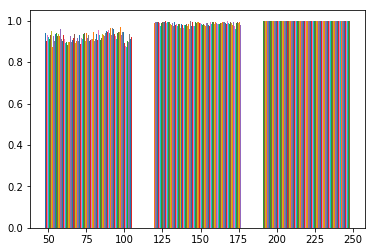

In [265]:
hist_itt = plt.hist(gauss_blur_images[0], bins=bin_list[0], density = True, cumulative = True)


In [ ]:
from sklearn import svm
from sklearn import datasets


In [ ]:
clf = svm.SVC(gamma='scale')
iris = datasets.load_iris()
X, y = iris.data, iris.target
clf.fit(X, y)
SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [271]:
hist_itt[0]

[array([ 0.94140625,  0.9921875 ,  1.        ]),
 array([ 0.8984375 ,  0.98828125,  1.        ]),
 array([ 0.88671875,  0.9765625 ,  1.        ]),
 array([ 0.90234375,  0.99609375,  1.        ]),
 array([ 0.90234375,  0.9921875 ,  1.        ]),
 array([ 0.8984375 ,  0.98828125,  1.        ]),
 array([ 0.9296875,  0.9921875,  1.       ]),
 array([ 0.91015625,  0.9921875 ,  1.        ]),
 array([ 0.93359375,  0.98828125,  1.        ]),
 array([ 0.921875  ,  0.99609375,  1.        ]),
 array([ 0.91796875,  0.99609375,  1.        ]),
 array([ 0.91015625,  0.9921875 ,  1.        ]),
 array([ 0.9140625,  0.984375 ,  1.       ]),
 array([ 0.91796875,  0.9921875 ,  1.        ]),
 array([ 0.91015625,  0.99609375,  1.        ]),
 array([ 0.9296875,  0.984375 ,  1.       ]),
 array([ 0.91015625,  0.98828125,  1.        ]),
 array([ 0.93359375,  0.99609375,  1.        ]),
 array([ 0.94921875,  0.99609375,  1.        ]),
 array([ 0.91015625,  0.9765625 ,  1.        ]),
 array([ 0.890625  ,  0.97265

In [284]:
ans = dens_cum_hist(gauss_blur_images[0], bin_list[0])

[[ 0.94140625  0.9921875   1.        ]
 [ 0.8984375   0.98828125  1.        ]
 [ 0.88671875  0.9765625   1.        ]
 [ 0.90234375  0.99609375  1.        ]
 [ 0.90234375  0.9921875   1.        ]
 [ 0.8984375   0.98828125  1.        ]
 [ 0.9296875   0.9921875   1.        ]
 [ 0.91015625  0.9921875   1.        ]
 [ 0.93359375  0.98828125  1.        ]
 [ 0.921875    0.99609375  1.        ]
 [ 0.91796875  0.99609375  1.        ]
 [ 0.91015625  0.9921875   1.        ]
 [ 0.9140625   0.984375    1.        ]
 [ 0.91796875  0.9921875   1.        ]
 [ 0.91015625  0.99609375  1.        ]
 [ 0.9296875   0.984375    1.        ]
 [ 0.91015625  0.98828125  1.        ]
 [ 0.93359375  0.99609375  1.        ]
 [ 0.94921875  0.99609375  1.        ]
 [ 0.91015625  0.9765625   1.        ]
 [ 0.890625    0.97265625  1.        ]
 [ 0.875       0.98046875  1.        ]
 [ 0.921875    0.98828125  1.        ]
 [ 0.8984375   0.99609375  1.        ]
 [ 0.92578125  0.98828125  1.        ]
 [ 0.91015625  0.9921875 

In [116]:
_img.dtype.str

'|u1'

In [225]:
cbook._reshape_2D(x, 'x')

[array([100,  77,  79, 113, 108,  95,  77, 110,  79, 100,  95,  77,  74,
         61, 108,  84,  77, 102,  92,  92,  82,  74,  64,  59,  79,  77,
        120,  82,  77,  82, 108,  79,  67,  97,  77,  64,  72,  79,  87,
         77,  82,  72, 102, 110,  97,  77,  64,  56,  92,  90,  74, 113,
         64,  74,  90,  64,  56,  87,  77,  95,  82,  82, 102,  56,  72,
         67,  90,  74,  97,  74,  92,  84,  74, 102,  79,  84,  59,  69,
         79, 100,  82,  92, 125, 100, 102,  92,  72, 255,  72,  82,  59,
         69, 105,  69,  90,  64,  82,  59,  97,  95, 118,  69,  87, 255,
        115,  87, 102,  97,  82,  64,  72,  72,  92, 100, 100,  82,  77,
         54,  87,  67,  69,  82,  77,  77,  72,  87,  90,  64,  72,  84,
         90,  61, 105,  77,  56,  95,  69,  79,  56,  82, 115,  92, 100,
        110,  67,  77,  69,  56,  64,  92,  61,  72,  74,  64,  72,  67,
        100, 110,  61, 100,  56, 100,  74,  74,  84,  74,  61,  67,  67,
         84,  69,  69,  67,  64,  79,  72,  95, 102

In [117]:
np.isscalar(gauss_blur_images[1])

False

In [104]:
np.diff(bin_list)

array([], dtype=int32)

In [286]:
checkbool = False
if checkbool:
    print('true')
else:
    print('false')

false
